In [36]:
import numpy as np
import pandas as pd  
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from tqdm import tqdm
import torch

import requests
import apimoex

import warnings
warnings.filterwarnings('ignore')

# Request запросы к сайту московской биржи и сбор данных

In [37]:
# request_url = ('https://iss.moex.com/iss/engines/stock/markets/shares/boards/TQBR/securities.json')



# with requests.Session() as session:
#     iss = apimoex.ISSClient(session, request_url)
#     stocks = iss.get()

# stocks_secids = [x['SECID'] for x in stocks['securities']]
# stocks_secnames = [x['SECNAME'] for x in stocks['securities']]

# stocks_info = pd.DataFrame(
#     {
#         'SECID': stocks_secids,
#         'SECNAME': stocks_secnames
#     }
# )

# stocks_info.head()

In [38]:
# request_url = ('https://iss.moex.com/iss/engines/stock/markets/bonds/boards/TQCB/securities.json')

# with requests.Session() as session:
#     iss = apimoex.ISSClient(session, request_url)
#     bonds = iss.get()

# bonds_secids = [x['SECID'] for x in bonds['securities']]
# bonds_secnames = [x['SECNAME'] for x in bonds['securities']]
# bonds_facevalues = [x['FACEVALUE'] for x in bonds['securities']]
# bonds_cupon_percents = [x['COUPONPERCENT'] for x in bonds['securities']]

# bonds_info = pd.DataFrame(
#     {
#         'SECID': bonds_secids,
#         'SECNAME': bonds_secnames,
#         'FACEVALUE': bonds_facevalues,
#         'COUPONPERCENT': bonds_cupon_percents
#     }
# )

# bonds_info.head()

In [39]:
# with requests.Session() as session:
#     dictionary_bonds = {}
#     for secid in tqdm(bonds_secids):
#         data = apimoex.get_board_history(session, secid, market='bonds', board='TQCB', columns=('TRADEDATE', 'CLOSE'))
#         dictionary_bonds[secid] = data

        
# with requests.Session() as session:
#     dictionary = {}
#     for secid in tqdm(stocks_secids):
#         data = apimoex.get_board_history(session, secid, columns=('TRADEDATE', 'CLOSE'))
#         dictionary[secid] = data

In [40]:
# data_stocks = pd.DataFrame({key: pd.DataFrame(value).set_index('TRADEDATE')['CLOSE'] for key, value in dictionary.items()})

# data_bonds = pd.DataFrame({key: pd.DataFrame(value).set_index('TRADEDATE')['CLOSE'] for key, value in dictionary_bonds.items()})

In [41]:
# data_stocks.to_csv('./data/data_stocks_moex.csv')
# data_bonds.to_csv('./data/data_bonds_moex.csv')
# stocks_info.to_csv('./data/stocks_info.csv')
# bonds_info.to_csv('./data/bonds_info.csv')

In [42]:
data_stocks = pd.read_csv('./data/data_stocks_moex.csv', index_col=0)
data_bonds = pd.read_csv('./data/data_bonds_moex.csv', index_col=0)
stocks_info = pd.read_csv('./data/stocks_info.csv')
bonds_info = pd.read_csv('./data/bonds_info.csv')

data_stocks.index = pd.to_datetime(data_stocks.index)
data_bonds.index = pd.to_datetime(data_bonds.index)

In [43]:
# Удаление активов, не торгуемых хоть 1 из последних 10 торговых дней
data_stocks_tail = data_stocks.tail(10).isna().any()
data_bonds_tail = data_bonds.tail(10).isna().any()

data_stocks = data_stocks[data_stocks_tail[data_stocks_tail == False].index]
data_bonds = data_bonds[data_bonds_tail[data_bonds_tail == False].index]

In [44]:
# Перевод доли от номинала в цену для облигаций
for col in data_bonds.columns:
    data_bonds[col] = bonds_info[bonds_info.SECID == col]['FACEVALUE'].item() * data_bonds[col] / 100

# data_bonds.tail()

In [45]:
# Поиск банковских активов

# bonds_info = bonds_info[bonds_info.SECNAME.str.lower().str.contains('банк|сфо|кредит|мфк|акб|сбер|втб|рсхб|вэб|еабр', regex=True)]
# data_bonds = data_bonds[set(bonds_info['SECID'].to_list()) & set(data_bonds.columns)]
# bonds_info = bonds_info[bonds_info['SECID'].isin(data_bonds.columns)]

# data_stocks = data_stocks[['SBER', 'TCSG', 'SBERP', 'BSPB', 'CARM', 'CBOM', 'BSPBP', 'ROSB', 'AVAN', 'USBN', 'KUZB', 'RDRB', 'PRMB', 'SVCB']]
# stocks_info = stocks_info[stocks_info['SECID'].isin(data_stocks.columns)]

# Алгоритм подбора активов в портфель

In [46]:
def compressor(series, alpha, beta):
   """
    Функция compressor выполняет компрессию временного ряда с устареванием.

    Параметры:
        - series (ndarray): Входной временной ряд, который подлежит компрессии.
        - alpha (float): Параметр, влияющий на степень компрессии (линейно).
        - beta (float): Параметр, влияющий на степень компрессии (нелинейно).

    Возвращает:
        ndarray: Компрессированный временной ряд.
    """

   # количество элементов в векторе и среднее
   T = series.size
   series_mean = series.mean()
   indexes = np.arange(T)

   # отклонения от среднего
   series_deviations = series - series_mean


   # вычисление компрессии
   if beta != 0:
      destruction_rate = 1-alpha*(1-(np.exp(-10*beta*(indexes-T)/T)-np.exp(10*beta)) / (1-np.exp(10*beta)))
   else:
      destruction_rate = 1-alpha*(1-(indexes/T))

   return series_mean + series_deviations * destruction_rate


def ewm(series, gamma):
   '''
   Вычисляет экспоненциальное скользящее среднее для данного временного ряда.

    Параметры:
        - series (pandas.Series): Серия данных для анализа.
        - gamma (float): Коэффициент сглаживания, должен находиться в диапазоне от 0 до 1.

    Возвращает:
        pandas.Series: Результаты экспоненциального скользящего среднего.
   '''

   # Вычисляем размер окна сглаживания на основе коэффициента gamma
   n = int(gamma * 80)

   # Применяем метод ewm к серии данных с заданным размером окна и без корректировки
   result = series.ewm(n, adjust=False).mean()

   return result


def mutation(series, alpha, beta, gamma):
    '''
    Выполняет преобразование серии данных с использованием компрессии и экспоненциального скользящего среднего.

    Параметры:
        - series (pandas.Series): Серия данных для анализа.
        - alpha (float): Параметр компрессии, должен находиться в диапазоне от 0 до 1.
        - beta (float): Параметр компрессии, должен находиться в диапазоне от 0 до 1.
        - gamma (float): Коэффициент сглаживания, должен находиться в диапазоне от 0 до 1.

    Возвращает:
        pandas.Series: Объект с преобразованными данными.
    '''

    # Сжимаем серию данных с помощью функции compressor
    series = compressor(series, alpha, beta)

    # Сглаживаем серию данных с помощью функции ewm
    series = ewm(series, gamma)

    return series


def relu_scaler(w):
    '''
    Масштабирует веса с использованием функции ReLU и нормализации.

    Параметры:
        - w (torch.tensor): Тензор с весами.

    Возвращает:
        torch.tensor: Тензор с масштабированными весами, сумма которых равна единице.
    '''

    # Применяем функцию relu к весам, чтобы обнулить отрицательные значения
    w = torch.relu(w)

    # Делим веса на их сумму, чтобы получить нормализованные значения
    return w / torch.sum(w)

def exp_scaler(w):
    '''
    Масштабирование весов с помощью экспоненты и нормализации.

    Параметры:
        - w (torch.tensor): Тензор с весами.

    Возвращает:
        torch.tensor: Тензор с масштабированными весами, сумма которых равна единице
    '''

    # Применяем функцию exp к весам, чтобы обнулить отрицательные значения
    w = torch.exp(w)

    # Делим веса на их сумму, чтобы получить нормализованные значения
    return w / torch.sum(w)

def abs_scaler(w):
    '''
    Масштабирование весов с помощью взятия модуля и нормализации.

    Параметры:
        - w (torch.tensor): Тензор с весами.

    Возвращает:
        torch.tensor: Тензор с масштабированными весами, сумма которых равна единице
    '''

    # Применяем функцию abs к весам, чтобы обнулить отрицательные значения
    w = torch.abs(w)

    # Делим веса на их сумму, чтобы получить нормализованные значения
    return w / torch.sum(w)


def project_onto_simplex(y):
    '''
    Проекция тензора на симплекс.

    Параметры:
        - w (torch.tensor): Тензор с весами.

    Возвращает:
        torch.tensor: Тензор с масштабированными весами, сумма которых равна единице
    '''

    # Определяем размерность тензора
    D = y.size(0)

    # Сортируем значения тензора по убыванию
    x = torch.sort(y, descending=True).values

    # Вычисляем вспомогательный тензор xtmp
    xtmp = (torch.cumsum(x, dim=0) - 1) / torch.arange(1, D + 1)

    # Находим индекс, где x > xtmp
    idx = torch.sum(x > xtmp)

    # Вычитаем xtmp[idx - 1] из y и обнуляем отрицательные значения
    x = torch.max(y - xtmp[idx - 1], torch.zeros_like(y))

    return x


def get_optimisation_metric(weights, returns, cov_matrix, scaler, optimisation_metric, confidence_level):
    '''
    Вычисляет оптимизационную метрику для портфеля акций.

    Параметры:
        - weights (torch.tensor): Веса акций в портфеле.
        - returns (torch.tensor): Доходности акций за период.
        - cov_matrix (torch.tensor): Ковариационная матрица акций.
        - scaler (str): Метод масштабирования весов ('simplex', 'relu', 'exp', 'abs').
        - optimisation_metric (str): Метрика оптимизации ('sharpe', 'sortino', 'value_at_risk', - 'sharpe+correlation' или 'sortino+correlation').
        - confidence_level (float): Уровень доверия для расчета value_at_risk, должен быть от 0 до 1.

    Возвращает:
        Число, равное отрицательному значению оптимизационной метрики.
    '''

    # Масштабируем веса в зависимости от выбранного метода
    match scaler:

        case 'simplex':
            weights = project_onto_simplex(weights)

        case 'relu':
            weights = relu_scaler(weights)

        case 'exp':
            weights = exp_scaler(weights)

        case 'abs':
            weights = abs_scaler(weights)

        case _:
            raise ValueError(f'Не существует метода масштабирования весов: {scaler}')    

    # Вычисляем среднюю доходность портфеля
    portfolio_return = torch.matmul(returns, weights)
    mean_portfolio_return = torch.mean(portfolio_return)
    
    # Выбираем оптимизационную метрику в зависимости от параметра
    match optimisation_metric:

        case 'sharpe':
            # Вычисляем стандартное отклонение доходности портфеля
            portfolio_volatility = torch.sqrt(torch.matmul(weights, torch.matmul(cov_matrix, weights)))
            # Вычисляем коэффициент Шарпа
            ratio = mean_portfolio_return / portfolio_volatility
    
        case 'sortino':
            # Вычисляем стандартное отклонение отрицательной доходности портфеля
            portfolio_volatility_downside = torch.std(portfolio_return[portfolio_return < 0])
            # Вычисляем коэффициент Сортино
            ratio = mean_portfolio_return / portfolio_volatility_downside
    
        case 'value_at_risk':
            # Вычисляем значение в риск на заданном уровне доверия
            ratio = portfolio_return.quantile(confidence_level, interpolation='higher')
    
        case 'sharpe+correlation':
            # Вычисляем стандартное отклонение доходности портфеля
            portfolio_volatility = torch.sqrt(torch.matmul(weights, torch.matmul(cov_matrix, weights)))
            # Вычисляем матрицу корреляции доходностей акций
            corr_matrix = torch.corrcoef(returns.T) # матрица корреляции
            # Вычисляем сумму абсолютных значений корреляций между акциями, умноженных на веса
            port_corr = torch.sum(torch.abs(corr_matrix * torch.outer(weights, weights)))
            # Вычисляем штраф за высокую корреляцию
            penalty = 1 - torch.abs(port_corr * port_corr * port_corr)
            # Вычисляем коэффициент Шарпа с учетом штрафа
            ratio = (mean_portfolio_return / portfolio_volatility) * penalty
    
        case 'sortino+correlation':
            # Вычисляем стандартное отклонение отрицательной доходности портфеля
            portfolio_volatility_downside = torch.std(portfolio_return[portfolio_return < 0])
            # Вычисляем матрицу корреляции доходностей акций
            corr_matrix = torch.corrcoef(returns.T) # матрица корреляции
            # Вычисляем сумму абсолютных значений корреляций между акциями, умноженных на веса
            port_corr = torch.sum(torch.abs(corr_matrix * torch.outer(weights, weights)))
            # Вычисляем штраф за высокую корреляцию
            penalty = 1 - torch.abs(port_corr * port_corr * port_corr)
            # Вычисляем коэффициент Сортино с учетом штрафа
            ratio = (mean_portfolio_return / portfolio_volatility_downside) * penalty
        
        case _:
            raise ValueError(f'Не существует метрики оптимизации: {optimisation_metric}')
        
    # Возвращаем отрицательное значение метрики, так как мы хотим ее максимизировать
    return -ratio



def calculate_frontier(
        returns, max_steps, convergence_window, 
        convergence_threshold, learning_rate, scaler,
        start_returns_date, all_std, 
        optimisation_metric, confidence_level
        ):
    '''
    Выполняет вычисление оптимальных весов активов в портфеле с помощью градиентного спуска.
    
    Параметры:
        - returns (pandas.DataFrame): Объект с доходностями акций за период.
        - max_steps (int): Максимальное количество шагов градиентного спуска.
        - convergence_window (int): Размер окна для проверки сходимости градиентного спуска.
        - convergence_threshold (float): Пороговое значение для среднего темпа роста потерь.
        - learning_rate (float): Скорость обучения для градиентного спуска.
        - scaler (str): Метод масштабирования весов ('simplex', 'relu', 'exp', 'abs').
        - start_returns_date (date): Дата, с которой начинается сегмент данных для оптимизации.
        - all_std (bool): Флаг, указывающий, вычислять ли ковариационную матрицу по всем данным или только по сегменту.
        - optimisation_metric (str): Метрика оптимизации ('sharpe', 'sortino', 'value_at_risk', 'sharpe+correlation' или 'sortino+correlation').
        - confidence_level (float): Уровень доверия для расчета value_at_risk, должен быть от 0 до 1.
    
    Возвращает:
        tuple: Кортеж из двух элементов:
        - optimal_weights (numpy.array): Массив с оптимальными весами акций в портфеле.
        - losses (list): Список с потерями на каждом шаге градиентного спуска.
    '''

    # Определяем количество активов в портфеле
    assets_count = returns.shape[1]

    # Выделяем сегмент данных для оптимизации
    if start_returns_date:
        returns_segment = returns[pd.Timestamp(start_returns_date):]
    else:
        returns_segment = returns

    # Преобразуем сегмент данных в тензор
    returns_segment = torch.tensor(returns_segment.to_numpy()).type(torch.float64)

    # Вычисляем ковариационную матрицу активов по всем данным или только по сегменту
    if all_std:
        returns_all = torch.tensor(returns.to_numpy()).type(torch.float64)
        cov_matrix = torch.cov(returns_all.T).type(torch.float64)
    else:
        cov_matrix = torch.cov(returns_segment.T).type(torch.float64)

    # Инициализируем веса активов в портфеле в зависимости от выбранного способа масштабирования
    # if scaler == 'simplex':
    #     weights = torch.nn.Parameter(torch.zeros(assets_count, dtype=torch.float64))
    # else:
    #     weights = torch.nn.Parameter(torch.full((assets_count, ), 1/assets_count, dtype=torch.float64))

    weights = torch.nn.Parameter(torch.full((assets_count, ), 1/assets_count, dtype=torch.float64))

    # Инициализируем оптимизатор для градиентного спуска с заданной скоростью обучения
    if learning_rate:
        optimizer = torch.optim.Adam([weights], lr=learning_rate)
    else:
        optimizer = torch.optim.Adam([weights])

    # Создаем пустые списки для хранения потерь и темпа роста потерь
    losses = []
    loss_growth_rate = []

    # Запускаем цикл градиентного спуска
    for step in range(max_steps):
        # Вычисляем потери на текущем шаге с помощью выбранной метрики оптимизации
        loss = get_optimisation_metric(weights, returns_segment, cov_matrix, scaler, optimisation_metric, confidence_level)
        # Преобразуем потери в число и меняем знак, так как мы хотим максимизировать метрику
        np_loss = -loss.detach().numpy().item()
        # Если список потерь не пуст, вычисляем темп роста потерь
        if losses:
            growth_rate = (np_loss - losses[-1]) / np.abs(losses[-1])
            # Добавляем темп роста потерь в список
            loss_growth_rate.append(growth_rate)
        # Если длина списка темпа роста потерь больше размера окна для проверки сходимости и средний темп роста потерь за последнее окно меньше порогового значения прерываем цикл градиентного спуска
        if len(loss_growth_rate) > convergence_window and np.mean(loss_growth_rate[-convergence_window:]) < convergence_threshold:
            break
        # Добавляем потери в список
        losses.append(np_loss)
        # Обнуляем градиенты
        optimizer.zero_grad()
        # Вычисляем градиенты
        loss.backward()
        # Обновляем веса
        optimizer.step()

    # Проектируем веса на симплекс и преобразуем в массив
    optimal_weights = project_onto_simplex(weights).detach().numpy()

    # Возвращаем оптимальные веса и список потерь
    return optimal_weights, losses


def get_metric_1(returns, returns_w):
        absolute_returns = returns
        expected_portfolio_absolute_return = absolute_returns.mean()
        portfolio_std_dev = absolute_returns.std(ddof=1)
        return (returns_w * expected_portfolio_absolute_return) / portfolio_std_dev

def get_metric_2(returns, returns_w):
    absolute_returns = returns
    expected_portfolio_absolute_return = absolute_returns.mean()
    portfolio_std_dev_downside = np.std(absolute_returns[absolute_returns < 0], ddof=1)
    return (returns_w * expected_portfolio_absolute_return) / portfolio_std_dev_downside



class get_best_portfolio:
    '''
    Класс для нахождения лучшего портфеля из акций и облигаций.

    Атрибуты:
        - total_available_funds (float): Общая доступная сумма для инвестиций.
        - data_stocks (pandas.DataFrame): Объект с данными по акциям.
        - stocks_info (pandas.DataFrame): Объект с информацией по акциям.
        - data_bonds (pandas.DataFrame): Объект с данными по облигациям.
        - bonds_info (pandas.DataFrame): Объект с информацией по облигациям.
        - bonds_returns (pandas.DataFrame): Объект с доходностями по облигациям.
        - stocks_returns (pandas.DataFrame): Объект с доходностями по акциям.
        - data_bonds_diff (pandas.DataFrame): Объект с изменениями цен по облигациям.
        - data_stocks_diff (pandas.DataFrame): Объект с изменениями цен по акциям.
        - all_data (pandas.DataFrame): Объект с объединенными данными по акциям и облигациям.
        - all_data_diff (pandas.DataFrame): Объект с объединенными изменениями цен по акциям и облигациям.
        - all_returns (pandas.DataFrame): Объект с объединенными доходностями по акциям и облигациям.
    '''

    def __init__(self, data_stocks, stocks_info, data_bonds, bonds_info, total_available_funds):
        '''
        Инициализация класса с данными и параметрами.

            Параметры:
                - data_stocks (pandas.DataFrame): Объект с данными по акциям.
                - stocks_info (pandas.DataFrame): Объект с информацией по акциям.
                - data_bonds (pandas.DataFrame): Объект с данными по облигациям.
                - bonds_info (pandas.DataFrame): Объект с информацией по облигациям.
                - total_available_funds (float): Общая доступная сумма в рублях для инвестиций.
        '''

        # Сохраняем общую доступную сумму для инвестиций
        self.total_available_funds = total_available_funds

        # Отбираем только те акции и облигации, цена которых меньше 80% от общей доступной суммы
        data_stocks = data_stocks[data_stocks.columns[data_stocks.iloc[-1] < 0.8 * total_available_funds]]
        data_bonds = data_bonds[data_bonds.columns[data_bonds.iloc[-1] < 0.8 * total_available_funds]]

        # Вычисляем годовой и дневной доход по облигациям
        bonds_info['gain_year'] = bonds_info.FACEVALUE * bonds_info['COUPONPERCENT'] / 100
        bonds_info['gain_day'] = bonds_info.gain_year / 253

        # Вычисляем изменения цен по облигациям и акциям
        data_bonds_diff = data_bonds.diff()
        data_stocks_diff = data_stocks.diff()

        # Добавляем дневной доход по облигациям к изменениям цен
        for secid in data_bonds_diff.columns:
            gain = bonds_info[bonds_info.SECID == secid].gain_day.values[0]
            data_bonds_diff[secid] = data_bonds_diff[secid] + gain

        # Вычисляем доходности по облигациям и акциям
        self.bonds_returns = data_bonds_diff / data_bonds.shift(1)
        self.stocks_returns = data_stocks.pct_change()

        # Сохраняем данные по изменениям цен
        self.data_bonds_diff = data_bonds_diff
        self.data_stocks_diff = data_stocks_diff

        # Объединяем данные по акциям и облигациям
        self.all_data = pd.concat([data_stocks, data_bonds], axis=1)
        self.all_data_diff = pd.concat([data_stocks_diff, data_bonds_diff], axis=1)
        self.all_returns = pd.concat([self.stocks_returns, self.bonds_returns], axis=1)

        # Сохраняем данные и информацию по акциям и облигациям
        self.data_stocks = data_stocks
        self.stocks_info = stocks_info
        self.data_bonds = data_bonds
        self.bonds_info = bonds_info


    def get_scores(
            self, 
            n_epochs, 
            max_steps=1000, 
            convergence_window=10, 
            convergence_threshold=1e-8, 
            random_shuffle=False,
            learning_rate=None,
            scaler=None,
            start_returns_date=None,
            all_std=True,
            optimisation_metric='sharpe',
            confidence_level=0.05,
            length_indexes=None
            ):
        '''
        Находит лучший портфель из акций и облигаций с помощью градиентного спуска.

        Параметры:
            - n_epochs (int): Количество эпох для поиска лучшего портфеля.
            - max_steps (int): Максимальное количество шагов градиентного спуска.
            - convergence_window (int): Размер окна для проверки сходимости градиентного спуска.
            - convergence_threshold (float): Пороговое значение для среднего темпа роста потерь.
            - random_shuffle (bool): Флаг, указывающий, перемешивать ли данные перед каждой эпохой.
            - learning_rate (float): Скорость обучения для градиентного спуска.
            - scaler (str): Метод масштабирования весов ('simplex', 'relu', 'exp', 'abs').
            - start_returns_date (date): Дата, с которой начинается сегмент данных для оптимизации.
            - all_std (bool): Флаг, указывающий, вычислять ли ковариационную матрицу по всем данным или только по сегменту.
            - optimisation_metric (str): Метрика оптимизации ('sharpe', 'sortino', 'value_at_risk', 'sharpe+correlation' или 'sortino+correlation').
            - confidence_level (float): Уровень доверия для расчета value_at_risk, должен быть от 0 до 1.
            - length_indexes (int): Сколько первых активов из отсортированного датасета использовать.

        Возвращает:
            pandas.DataFrame: Объект с результатами поиска лучшего портфеля.
        '''
        # Инициализация списков для хранения результатов
        self.sorted_indexes_all_epoch = []
        self.finish_portfolio_list = []
        self.finish_metric_list = []
        self.finish_weights_list = []
        self.number_epoch = []
        self.finish_residue_list = []
        self.finish_count_assets_list = []
        self.best_gradient_learning = 0

        # Цикл по эпохам
        for epoch in range(1, n_epochs+1):            
            # Если выбран случайный порядок активов
            if random_shuffle:
                # Получение массива всех индексов активов
                sorted_indexes = self.data.columns.to_numpy()
                # Перемешивание массива
                np.random.shuffle(sorted_indexes)               
            # Если выбран порядок активов по заданным критериям
            else:
                # Генерация случайных параметров для сортировки
                alpha = np.random.uniform(0, 1)
                beta = np.random.uniform(0, 1)
                gamma = np.random.uniform(0, 1)
                short_existence_penalty_score = np.random.uniform(0, 1) 
                w_1 = np.random.uniform(0, 1)
                returns_w1 = np.random.uniform(0, 1)
                returns_w2 = np.random.uniform(0, 1)
                # Получение отсортированного массива индексов активов
                sorted_indexes = self.get_sort_assets(
                        alpha, beta, gamma, 
                        short_existence_penalty_score, 
                        w_1, returns_w1, returns_w2
                        )
                # Добавление массива в список
                self.sorted_indexes_all_epoch.append(sorted_indexes)
            
            # Инициализация списков для хранения промежуточных результатов
            portfolio = []
            finish_portfolio = None
            finish_metric = 0
            finish_residue = 0
            finish_count_assets = None
            finish_weights = None
            returns = None
            gradients_learning = []
            excluded_for_size = 0
            excluded_for_metric = 0

            print(f'ЭПОХА {epoch}')
            print('-------')


            # Цикл по выбранным индексам активов
            for name_index in tqdm(sorted_indexes[:length_indexes]):
                # Добавление индекса в портфель
                portfolio.append(name_index)
                # Получение доходностей по портфелю
                returns = self.all_returns[portfolio]

                # Получение доходности по текущему индексу
                index_returns = returns[name_index][start_returns_date:]
                # Проверка разницы пропусков до и после интерполяции
                if index_returns.interpolate(method="time").dropna().shape[0] > 1.2 * index_returns.dropna().shape[0]:
                    # Исключение индекса из портфеля, если изменение количества пропусков после интерполяции слишком большое
                    portfolio.remove(name_index)
                    # Увеличение счетчика исключенных индексов по размеру
                    excluded_for_size += 1
                    # Пропуск оставшейся части цикла
                    continue
                # Повторная проверка наличия пропусков в данных
                if index_returns.shape[0] > 1.2 * index_returns.dropna().shape[0]:
                    # Исключение индекса из портфеля, если пропусков слишком много
                    portfolio.remove(name_index)
                    # Увеличение счетчика исключенных индексов по размеру
                    excluded_for_size += 1
                    # Пропуск оставшейся части цикла
                    continue

                # Интерполяция и удаление пропусков в данных
                # returns = returns.interpolate(method="time")
                returns = returns.interpolate(method="time").dropna()

                # print(returns)

                # Проверка количества индексов в портфеле
                if len(portfolio) == 1:
                    # Пропуск оставшейся части цикла, если индекс один
                    continue
                else:
                    # Вычисление оптимальных весов и оптимизационной метрики для портфеля
                    optimal_w_iter, opt_metric = calculate_frontier(
                                                                    returns, 
                                                                    max_steps, 
                                                                    convergence_window, 
                                                                    convergence_threshold, 
                                                                    learning_rate,
                                                                    scaler,
                                                                    start_returns_date,
                                                                    all_std,
                                                                    optimisation_metric,
                                                                    confidence_level
                                                                    )
                    # Добавление значения метрики оптимизации в список
                    gradients_learning.append(opt_metric)

                    # Вычисление селекционной метрики и дополнительной информации для портфеля
                    selection_metric, info, residue = self.get_selection_metric(portfolio,
                                                                optimal_w_iter,
                                                                start_returns_date,
                                                                all_std
                                                                )
                    # Сравнение метрики отбора с текущей лучшей метрикой
                    if finish_metric < selection_metric:
                        # Обновление лучшей метрики, остатка, портфеля, количества и весов активов
                        finish_metric = selection_metric
                        finish_residue = residue
                        finish_portfolio = info.portfolio.to_list()
                        finish_count_assets = info.count_assets
                        finish_weights = info.count_assets * info.market_price / (info.count_assets * info.market_price).sum()
                        # Обновление лучшего значения градиента обучения
                        self.best_gradient_learning = gradients_learning
                    else:
                        # Исключение индекса из портфеля, если метрика отбора не улучшилась
                        portfolio.remove(name_index)
                        # Увеличение счетчика исключенных индексов по метрике
                        excluded_for_metric += 1   
            print(f'''
                  размер портфеля: {len(finish_portfolio)}, 
                  остаток средств: {finish_residue},
                  итоговая метрика: {finish_metric},
                  исключено из-за размера {excluded_for_size}, 
                  исключено из-за метрики: {excluded_for_metric}
                ''')
            
            self.gradients_learning = gradients_learning
            self.finish_portfolio_list.append(finish_portfolio)
            self.finish_metric_list.append(finish_metric)
            self.finish_residue_list.append(finish_residue)
            self.finish_count_assets_list.append(finish_count_assets)
            self.finish_weights_list.append(finish_weights)
            self.number_epoch.append(epoch)

        return pd.DataFrame({
            'number_epoch': self.number_epoch,
            'portfolio': self.finish_portfolio_list,
            'finish_metric': self.finish_metric_list,
            'finish_residue': self.finish_residue_list,
            'finish_count_assets': self.finish_count_assets_list,
            'finish_weights': self.finish_weights_list
        })


    def learning_visualisation(self):
        '''
        Функция для визуализации градиентного спуска
        '''
        # Импорт необходимых модулей
        from itertools import zip_longest
        from sklearn.preprocessing import MinMaxScaler
        # Создание списка из градиентов обучения для каждого актива
        y = list(zip_longest(*self.gradients_learning, fillvalue=np.nan))
        # Масштабирование списка в диапазон от 0 до 1
        y_scaled = MinMaxScaler().fit_transform(y)
        # Создание фигуры с двумя подграфиками
        fig, ax = plt.subplots(2, figsize=(20, 20))
        # Отрисовка масштабированных градиентов на первом подграфике
        ax[0].plot(y_scaled)
        # Отрисовка исходных градиентов на втором подграфике
        ax[1].plot(y)


    def get_sort_assets(self, alpha, beta, gamma, short_existence_penalty_score, w_1, returns_w1, returns_w2):
        '''
        Сортирует активы по заданным критериям и возвращает список их названий.

        Параметры:
            - alpha (float): Параметр для функции mutation, которая преобразует временные ряды активов.
            - beta (float): Параметр для функции mutation, которая преобразует временные ряды активов.
            - gamma (float): Параметр для функции mutation, которая преобразует временные ряды активов.
            - short_existence_penalty_score (float): Коэффициент штрафа за короткое существование актива.
            - w_1 (float): Вес для комбинирования двух метрик, используемых для сортировки активов.
            - returns_w1 (float): Вес для вычисления доходности актива.
            - returns_w2 (float): Вес для вычисления доходности актива.

        Возвращает:
            list: Список названий активов, отсортированных по убыванию их нового рейтинга.
        '''

        # Инициализация пустых списков для хранения названий активов, метрик и времени существования
        asset_names = []
        metrics_1 = []
        metrics_2 = []
        existence_time = []

        # Цикл по всем колонкам данных, содержащим временные ряды активов
        for asset_name in self.all_data.columns:

            # Получение временного ряда для текущего актива
            series = self.all_data[asset_name]
            # Применение функции mutation к временному ряду с заданными параметрами
            series = mutation(series, alpha, beta, gamma)

            # Вычисление разности между соседними значениями временного ряда
            series_diff = series.diff()

            # Проверка, является ли актив облигацией
            if series.name in self.bonds_info.SECID.unique():
                # Добавление прироста стоимости облигации к купону
                series_diff = series_diff + self.bonds_info[self.bonds_info.SECID == series.name].gain_day.values[0]

            # Вычисление первой метрики для актива с заданным весом доходности
            metric_1 = get_metric_1(series_diff, returns_w1)
            # Вычисление второй метрики для актива с заданным весом доходности
            metric_2 = get_metric_2(series_diff, returns_w2)

            # Добавление названия актива и метрик в соответствующие списки
            asset_names.append(asset_name)
            metrics_1.append(metric_1)
            metrics_2.append(metric_2)

            # Удаление пропущенных значений из временного ряда
            series = series.dropna()
            # Добавление размера временного ряда в список
            existence_time.append(series.size)

        # Создание датафрейма с данными об активах и метриках
        data_metrics = pd.DataFrame({
            'asset_name': asset_names,
            'metric_1': metrics_1,
            'metric_2': metrics_2,
            'existence_time': existence_time
        })

        # Вычисление рангов для первой и второй метрики по возрастанию
        data_metrics['rank_metric_1'] = data_metrics['metric_1'].rank(ascending=True)
        data_metrics['rank_metric_2'] = data_metrics['metric_2'].rank(ascending=True)

        # Вычисление общего рейтинга для актива как взвешенной суммы рангов метрик
        data_metrics['score'] = w_1 * data_metrics['rank_metric_1'] + (1 - w_1) * data_metrics['rank_metric_2']

        # Вычисление среднего и стандартного отклонения времени существования активов
        mean_time = data_metrics['existence_time'].mean()
        std_time = data_metrics['existence_time'].std()
        # Вычисление z-оценки для времени существования активов
        data_metrics['existence_time_z'] = (data_metrics['existence_time'] - mean_time) / std_time

        # Вычисление штрафа для активов с отрицательной z-оценкой времени существования
        data_metrics['penalty'] = data_metrics.apply(
            lambda x: (short_existence_penalty_score * x['existence_time_z'])/(-data_metrics['existence_time_z'].min()) + 1 if x['existence_time_z'] < 0 else 1, axis=1
            )

        # Вычисление нового рейтинга для актива как произведения рейтинга и штрафа
        data_metrics['new_score'] = data_metrics['score'] * data_metrics['penalty']

        # Сортировка активов по убыванию нового рейтинга
        data_metrics = data_metrics.sort_values(by='new_score', ascending=False)

        # Возвращение списка названий активов
        return data_metrics['asset_name'].to_list()

    
    def get_selection_metric(self, portfolio, opt_weights, start_returns_date, all_std):
        """
        Вычисляет метрику отбора для заданного портфеля активов.

        Параметры:
            - portfolio (list): Список названий активов, входящих в портфель.
            - opt_weights (list): Список оптимальных весов активов в портфеле.
            - start_returns_date (date): Дата, с которой начинается расчет доходности портфеля.
            - all_std (bool): Булева переменная, указывающая, какой период использовать для расчета стандартного отклонения доходности портфеля.

        Возвращает:
            tuple: Кортеж из трех элементов:
            - metric (float): Значение метрики отбора, равное отношению средней доходности портфеля к стандартному отклонению доходности портфеля.
            - portfolio_info (pandas.DataFrame): Датафрейм с информацией о портфеле, включающей названия активов, количество активов и рыночную цену активов.
            - residue (float): Остаток средств, не вложенных в портфель.
        """

        # Вычисление рыночной цены активов на последнюю дату данных
        market_price = self.all_data[portfolio].iloc[-1].to_numpy()

        # Вычисление средств, выделенных для каждого актива в портфеле
        funds_per_asset = self.total_available_funds * opt_weights

        # Вычисление количества активов, которые можно купить на выделенные средства
        count_assets = funds_per_asset // market_price

        # Вычисление остатка средств, не вложенных в портфель
        residue = np.sum(funds_per_asset % market_price)

        # Создание датафрейма с информацией о портфеле
        portfolio_info = pd.DataFrame(
            {
                'portfolio': portfolio,
                'count_assets': count_assets,
                'market_price': market_price
            }
        )

        # Отбор активов, для которых количество больше нуля
        portfolio_info = portfolio_info[portfolio_info['count_assets'] > 0]

        # Вычисление доходности портфеля как суммы доходностей активов, умноженных на их количество
        portfolio_diff = (self.all_data_diff[portfolio_info.portfolio] * portfolio_info.count_assets.to_numpy()).sum(axis=1)

        # Вычисление доходности портфеля по месяцам как суммы доходностей по дням
        portfolio_diff_month = portfolio_diff.resample('M').sum()

        # Вычисление средней доходности портфеля за заданный период
        portfolio_diff_month_mean = portfolio_diff_month[start_returns_date:].mean()

        # Вычисление стандартного отклонения доходности портфеля за заданный период или за весь период в зависимости от параметра all_std
        if all_std == False:
            portfolio_diff_month_std = portfolio_diff_month[start_returns_date:].std()
        else:
            portfolio_diff_month_std = portfolio_diff_month.std()

        # Вычисление метрики отбора как отношения средней доходности к стандартному отклонению
        metric = portfolio_diff_month_mean / portfolio_diff_month_std

        # Возвращение кортежа из метрики, информации о портфеле и остатка
        return metric, portfolio_info, residue

In [47]:
test = get_best_portfolio(
    data_stocks=data_stocks, 
    data_bonds=data_bonds, 
    bonds_info=bonds_info, 
    stocks_info=stocks_info,
    total_available_funds=1000000
    )

rest_data = test.get_scores(
    n_epochs=5, 
    max_steps=1000, 
    convergence_window=4, 
    convergence_threshold=1e-6, 
    random_shuffle=False, 
    scaler='simplex',
    start_returns_date='2022-03-22',
    all_std=False,
    optimisation_metric='sortino+correlation',
    length_indexes=300
    
    # learning_rate=0.3
    )

ЭПОХА 1
-------


100%|██████████| 300/300 [02:38<00:00,  1.89it/s]



                  размер портфеля: 7, 
                  остаток средств: 3034.7000000000407,
                  итоговая метрика: 2.22579692924606,
                  исключено из-за размера 92, 
                  исключено из-за метрики: 195
                
ЭПОХА 2
-------


100%|██████████| 300/300 [01:47<00:00,  2.78it/s]



                  размер портфеля: 11, 
                  остаток средств: 7235.030000000007,
                  итоговая метрика: 2.7841779039168317,
                  исключено из-за размера 61, 
                  исключено из-за метрики: 207
                
ЭПОХА 3
-------


100%|██████████| 300/300 [01:17<00:00,  3.86it/s]



                  размер портфеля: 8, 
                  остаток средств: 3516.9000000000215,
                  итоговая метрика: 3.0757182693217215,
                  исключено из-за размера 107, 
                  исключено из-за метрики: 177
                
ЭПОХА 4
-------


100%|██████████| 300/300 [00:53<00:00,  5.64it/s]



                  размер портфеля: 12, 
                  остаток средств: 5895.049999999865,
                  итоговая метрика: 1.9276488916192325,
                  исключено из-за размера 164, 
                  исключено из-за метрики: 106
                
ЭПОХА 5
-------


100%|██████████| 300/300 [01:32<00:00,  3.24it/s]


                  размер портфеля: 11, 
                  остаток средств: 6564.199999999859,
                  итоговая метрика: 2.259683810705654,
                  исключено из-за размера 69, 
                  исключено из-за метрики: 211
                


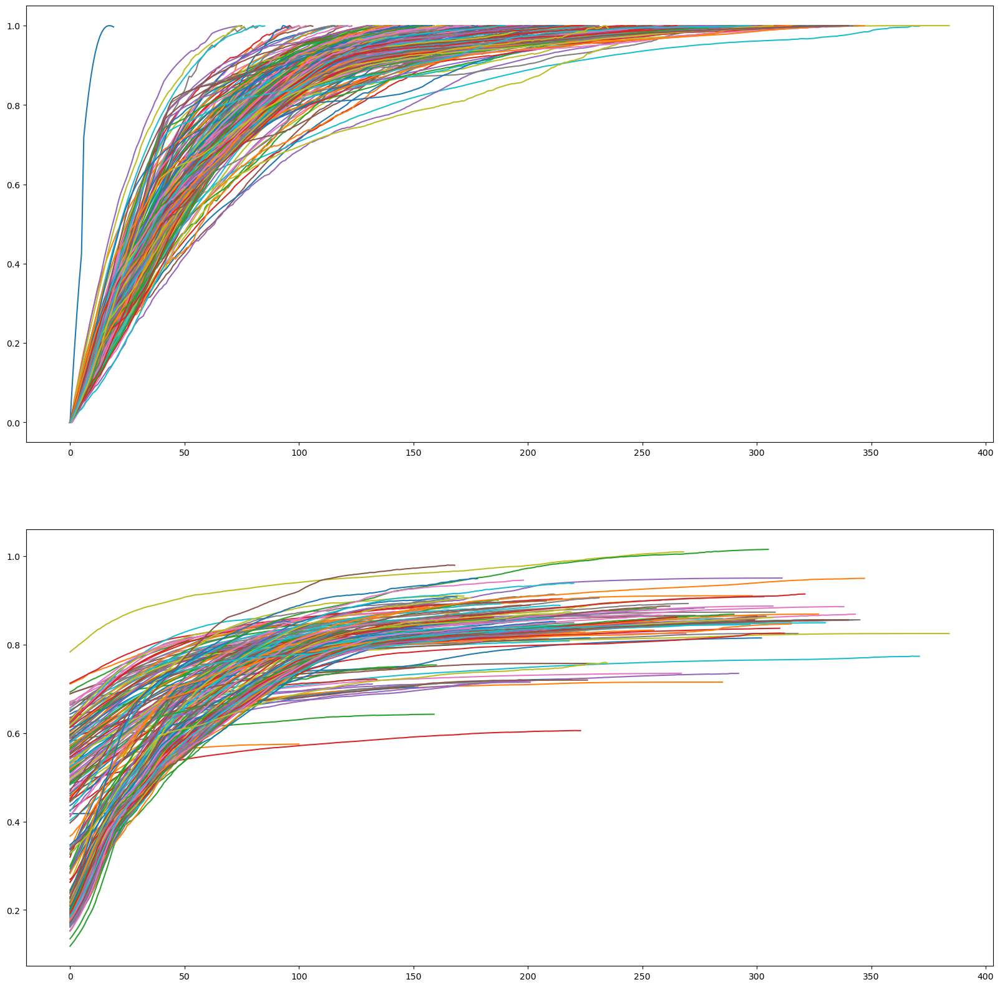

In [48]:
# Визуализация обучения ADAM для самой лучшей эпохи
test.learning_visualisation()

In [49]:
# Информация об эпохах
# rest_data.sort_values(by='finish_metric', ascending=False)

In [50]:
# Подобранные активы в портфель (веса, количество, тикер, название)

best_asses = pd.DataFrame(
    {
        'w': rest_data.sort_values(by='finish_metric', ascending=False).iloc[0]['finish_weights'].round(4),
        'count_assets': rest_data.sort_values(by='finish_metric', ascending=False).iloc[0]['finish_count_assets'],
        'name': rest_data.sort_values(by='finish_metric', ascending=False).iloc[0]['portfolio']
    }
)

best_asses = best_asses.sort_values(by='w', ascending=False)

best_asses = pd.merge(best_asses, bonds_info[['SECID', 'SECNAME']], left_on='name', right_on='SECID', how='left').drop('SECID', axis=1)

best_asses = pd.merge(best_asses, stocks_info[['SECID', 'SECNAME']], left_on='name', right_on='SECID', how='left').drop('SECID', axis=1)

best_asses['SECNAME'] = best_asses['SECNAME_x'].fillna(best_asses['SECNAME_y'])

best_asses = best_asses.drop(['SECNAME_x', 'SECNAME_y'], axis=1)

best_asses

,w,count_assets,name,SECNAME
0,0.3131,312.0,RU000A104V00,Пионер-Лизинг БР5
1,0.2667,267.0,RU000A0JXPN8,Ростелеком ПАО 001P-02R
2,0.1324,131.0,RU000A100DZ5,ИКБ Совкомбанк ПАО обл. БО-П01
3,0.0771,76.0,RU000A104TM1,Хайтэк-Интеграция БО-01
4,0.0758,131.0,RU000A100DG5,ПАО ЛК Европлан БО-06
5,0.0609,66.0,RU000A0ZYNY4,ГосТранспортЛизингКомп 001P-07
6,0.0422,42.0,RU000A0JUQC5,Ашинский метзавод ПАО БО-01
7,0.0318,30.0,RU000A1013N6,Пионер-Лизинг БО-П03


In [51]:
# Облигации
bonds_info[bonds_info['SECID'].isin(best_asses.sort_values(by='w', ascending=False)['name'])]

,Unnamed: 0,SECID,SECNAME,FACEVALUE,COUPONPERCENT,gain_year,gain_day
52,52,RU000A0JUQC5,Ашинский метзавод ПАО БО-01,1000.0,16.50,165.0,0.652174
219,219,RU000A0JXPN8,Ростелеком ПАО 001P-02R,1000.0,13.20,132.0,0.521739
334,334,RU000A0ZYNY4,ГосТранспортЛизингКомп 001P-07,1000.0,11.70,117.0,0.462451
462,462,RU000A100DG5,ПАО ЛК Европлан БО-06,600.0,10.25,61.5,0.243083
465,465,RU000A100DZ5,ИКБ Совкомбанк ПАО обл. БО-П01,1000.0,13.75,137.5,0.543478
540,540,RU000A1013N6,Пионер-Лизинг БО-П03,1000.0,22.00,220.0,0.869565
1379,1379,RU000A104TM1,Хайтэк-Интеграция БО-01,1000.0,19.00,190.0,0.750988
1384,1384,RU000A104V00,Пионер-Лизинг БР5,1000.0,19.45,194.5,0.768775


In [52]:
# Акции
stocks_info[stocks_info['SECID'].isin(best_asses.sort_values(by='w', ascending=False)['name'])]

,Unnamed: 0,SECID,SECNAME


<Axes: xlabel='TRADEDATE'>

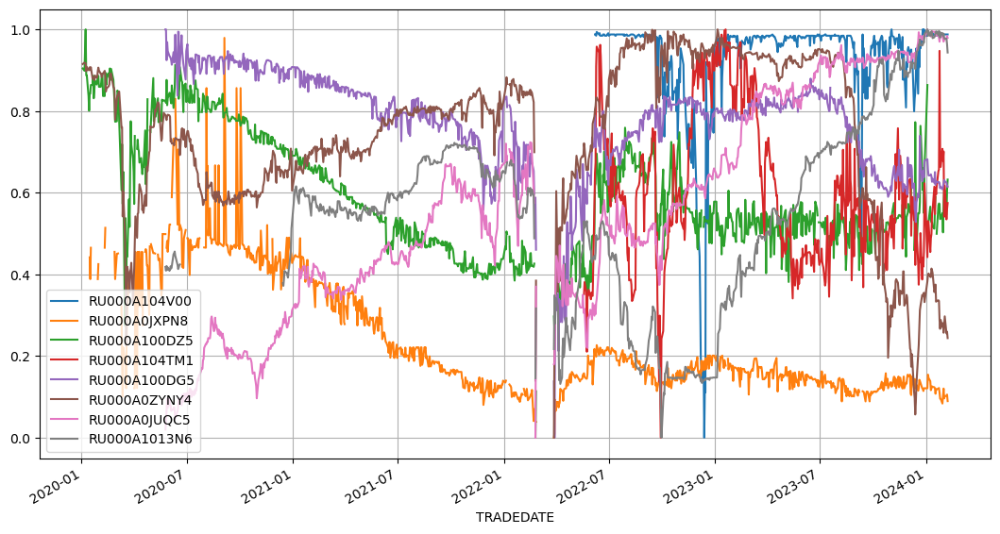

In [53]:
# Отнормированные рыночные цены активов портфеля
gg = pd.concat([data_stocks, data_bonds], axis=1)[best_asses.sort_values(by='w', ascending=False)['name']]['2020-01-01':]

from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

pd.DataFrame(
    scaler.fit_transform(gg),
    columns=gg.columns,
    index=gg.index
).iloc[:, :10].plot(
    figsize=(13, 7),
    grid=True
    )

# Compression test

In [54]:
test = data_stocks['SBER']

In [55]:
alpha_values = np.arange(0, 1, 0.1).round(2)
beta_values = np.arange(0, 1, 0.2).round(2)

result_df = pd.DataFrame(columns=['TRADEDATE', 'alpha', 'beta', 'close'])

for alpha in tqdm(alpha_values):
    for beta in beta_values:
        close = compressor(test, alpha, beta)
        temp_df = pd.DataFrame({
            'TRADEDATE': test.index[1:],
            'alpha': alpha,
            'beta': beta,
            'close': close[1:],  
        })
        result_df = pd.concat([result_df, temp_df], ignore_index=True)

result_df.sort_values(by=['TRADEDATE', 'alpha', 'beta'], inplace=True)

  0%|          | 0/10 [00:00<?, ?it/s]

100%|██████████| 10/10 [00:00<00:00, 69.86it/s]


In [56]:
fig = px.line(result_df, x='TRADEDATE', y='close', color='beta', animation_frame='alpha')

fig.update_layout(width=1000, height=600)

fig.show()

In [57]:
alpha_values = np.arange(0, 1, 0.2)
beta_values = np.arange(0, 1, 0.1).round(2)

result_df = pd.DataFrame(columns=['TRADEDATE', 'alpha', 'beta', 'close'])

for alpha in tqdm(alpha_values):
    for beta in beta_values:
        close = compressor(test, alpha, beta)
        temp_df = pd.DataFrame({
            'TRADEDATE': test.index[1:],
            'alpha': alpha,
            'beta': beta,
            'close': close[1:],  
        })
        result_df = pd.concat([result_df, temp_df], ignore_index=True)

result_df.sort_values(by=['TRADEDATE', 'alpha', 'beta'], inplace=True)

100%|██████████| 5/5 [00:00<00:00, 35.72it/s]


In [58]:
fig = px.line(result_df, x='TRADEDATE', y='close', color='alpha', animation_frame='beta')

fig.update_layout(width=1000, height=600)

fig.show()